### **Project Overview**

This project explores keyword co-occurrence patterns within a dataset of academic article metadata. The primary objective is to identify how keywords cluster around shared themes and which terms serve as central connectors across topics. Using network analysis techniques, I constructed a graph where nodes represent individual keywords and weighted edges represent their co-occurrence frequency. Key metrics such as node degree and strength were computed to quantify keyword influence and thematic reach. The analysis provides insight into how concepts are interlinked, highlighting both broadly connected topics and specific, high-impact terms.


### 📂 Load & Preview Dataset

I begin with a CSV of article metadata—titles and up to 12 loosely tagged keywords. The raw file reveals:

- Sparse and irregular keyword fields  
- Inconsistent casing, punctuation, and formatting  
- Multi-word terms fragmented and hard to interpret 

In [14]:
import pandas as pd

articles_path = 'articles-dataset/articles.csv'  
df = pd.read_csv(articles_path)
print(df.head())

                                               Title  \
0                                             Feb/03   
1                                                NaN   
2  Meta-Analyses of Financial Performance and Equ...   
3  Home Country Environments, Corporate Diversifi...   
4  Safeguarding Investments in Asymmetric Interor...   

                       Keyword 1                 Keyword 2  \
0                            NaN                       NaN   
1                            NaN                       NaN   
2                         EQUITY  ORGANIZATIONAL sociology   
3    DIVERSIFICATION in industry         BUSINESS planning   
4  INTERORGANIZATIONAL relations      INTERGROUP relations   

                Keyword 3               Keyword 4          Keyword 5  \
0                     NaN                     NaN                NaN   
1                     NaN                     NaN                NaN   
2             PERFORMANCE           META-analysis      PSYCHOMETRICS   
3 

### 🧹 Text Data Cleaning & Preprocessing

The transformation journey began by taking unstructured, inconsistent academic keyword metadata and shaping it into analyzable, structured form. This process was rooted in a beginner's resolve to reduce noise while preserving signal—an essential foundation for meaningful analysis. 

### 🔧 Key Cleaning Tasks

1. **Column Renaming & Null Handling**  
   Columns were renamed for uniformity, and missing values were replaced with empty strings to preserve the matrix's structural integrity.

2. **Noise Reduction**  
   Inconsistencies were addressed by lowercasing entries, removing punctuation, and normalizing spacing and hyphenation—small changes that made a significant difference.

3. **Stopword Removal**  
   Common English stopwords were filtered out, helping emphasize meaningful domain-relevant terms while trimming linguistic clutter.

4. **Multi-Word Phrase Preservation**  
   Domain-specific expressions like *"social networks"* and *"corporate governance"* were preserved as semantic units. This step protected them from being fragmented, ensuring thematic coherence in the data.

5. **Row Filtering**  
   Articles lacking any meaningful keyword content were filtered out. This boosted the dataset’s signal-to-noise ratio and ensured that every record contributed to the overall analysis.

✅ **The result**: a clean, normalized DataFrame of keywords, ready for frequency counts and network graph construction.

In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.util import ngrams

# Suppress nltk download messages
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)

# Load the dataset
articles_path = 'articles-dataset/articles.csv'
df = pd.read_csv(articles_path)

# Rename columns to "Keyword 1", "Keyword 2", ..., "Keyword N" (excluding Title)
df.columns = ["Title"] + [f"Keyword {i}" for i in range(1, len(df.columns))]

# Drop the "Title" column
df = df.drop(columns=["Title"])

# Fill NaN values with empty strings
df = df.fillna('')

# Initialize stopwords
stop_words = set(stopwords.words('english'))

# Predefined multi-word phrases from instructions (expand as needed)
multi_word_phrases = [
    "social networks", "diversification industry",
    "information resources management", "management information systems",
    "corporations investor relations"
]

def clean_text(text):
    """
    Cleans and preprocesses text while preserving multi-word phrases.
    
    Args:
        text (str): The text to clean.
    
    Returns:
        str: The cleaned text with multi-word phrases preserved.
    """
    if isinstance(text, str):
        text = text.strip().lower()  # Lowercase and trim spaces
        text = re.sub(r'--+', ' ', text)  # Replace multiple hyphens with space
        text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation

        # Replace multi-word phrases with an underscore version (e.g., "social_networks")
        for phrase in multi_word_phrases:
            text = text.replace(phrase, phrase.replace(" ", "_"))
        
        tokens = word_tokenize(text)  # Tokenize the text
        
        # Remove stopwords
        tokens = [token for token in tokens if token not in stop_words]

        # Convert underscores back to spaces for readability
        return ' '.join(tokens).replace("_", " ")

    return ''  # Return empty string for non-string input

# Apply the function
df_cleaned = df.map(clean_text)

# Remove empty rows
df_cleaned = df_cleaned[df_cleaned.apply(lambda row: any(row), axis=1)]

# Reset index
df_cleaned.reset_index(drop=True, inplace=True)

# Display cleaned DataFrame
df_cleaned.head()

,Keyword 1,Keyword 2,Keyword 3,Keyword 4,Keyword 5,Keyword 6,Keyword 7,Keyword 8,Keyword 9,Keyword 10,Keyword 11,Keyword 12
0,equity,organizational sociology,performance,metaanalysis,psychometrics,organizational research,financial performance,agency theory,organizational effectiveness,organizational behavior,corporate governance,
1,diversification industry,business planning,performance standards,employees rating,corporate culture,strategic planning,organizational effectiveness,management science,management research,product management,,
2,interorganizational relations,intergroup relations,business communication,investments,supply chains,knowledge management,interorganizational networks,corporate governance,group decision making,intellectual capital,,
3,executive compensation,wages,human capital,labor economics,personnel management,management science,contingency theory management,compensation management,executive ability management,corporate governance,,
4,knowledge management,information resources management,management information systems,breakeven analysis,data mining,management science,research development,research development contracts,corporate governance,decision making,organizational behavior,transaction costs


### Extracting Semantic Signals: Article-Level Keyword Isolation for Network Analysis

This step isolates relevant thematic signals by cleaning and standardizing article-level keywords.
We remove linguistic noise—punctuation, stopwords, formatting inconsistencies—while preserving multi-word phrases critical to interpretation.
The result: a refined set of keywords per article, ready for semantic clustering and network-based analysis.

In [4]:
import pandas as pd
import re
import string
from nltk.corpus import stopwords
import nltk

# Download the stopwords list from NLTK
nltk.download('stopwords', quiet=True)

# Define multi-word phrases to preserve
multi_word_phrases = [
    "diversification in industry",
    "social networks",
    "employees rating off"
]

# Define stopwords list using NLTK (or customize this list)
stop_words = set(stopwords.words('english'))


def load_dataset(file_path: str) -> pd.DataFrame:
    """
    Load dataset from a local CSV file.

    Parameters:
        file_path (str): The path to the CSV file.

    Returns:
        pd.DataFrame: The loaded dataset.
    """
    try:
        df = pd.read_csv(file_path)
        print(f"Dataset loaded successfully. Shape: {df.shape}")
        return df
    except Exception as e:
        print(f"Error loading dataset: {e}")
        return pd.DataFrame()  # Return an empty DataFrame if there's an issue


def clean_keyword(keyword: str) -> str:
    """
    Cleans and standardizes a single keyword, preserving multi-word phrases.
    Removes stopwords, double hyphens, punctuation, and extra whitespace,
    and converts the keyword to lowercase.

    Args:
        keyword (str): The keyword string to clean.

    Returns:
        str: The cleaned keyword string.
    """
    # First, check if the keyword matches any multi-word phrase
    for phrase in multi_word_phrases:
        if phrase in keyword:
            return phrase.lower()  # Return the phrase as is, in lowercase

    # Clean the keyword if no multi-word phrase match is found
    keyword = re.sub(r'--+', ' ', keyword)  # Replace double hyphens with spaces
    keyword = re.sub(r'[' + string.punctuation + ']', '', keyword)  # Remove punctuation
    keyword = " ".join(keyword.split())  # Remove extra whitespace
    keyword = keyword.lower().strip()  # Convert to lowercase and remove leading/trailing spaces

    # Split the keyword into individual words and remove stopwords
    cleaned_tokens = [word for word in keyword.split() if word not in stop_words]
    
    # Join the tokens back into a single string (after stopword removal)
    return ' '.join(cleaned_tokens)


def extract_article_keywords(df: pd.DataFrame) -> list:
    """
    Extract keywords while preserving article-level associations.

    Parameters:
        df (pd.DataFrame): The dataset containing articles and keywords.

    Returns:
        list: A list of lists, where each inner list contains keywords for an article.
    """
    if df.empty:
        print("No data to process.")
        return []

    # Ignoring the first column (assumed to be the "Title")
    keyword_columns = df.columns[1:]

    # Create a list of article keywords by iterating over each row
    article_keywords = [
        [clean_keyword(str(row[col]))  # Clean text (no need to strip twice)
         for col in keyword_columns if pd.notna(row[col])]  # Only non-NaN values
        for _, row in df.iterrows()  # Iterate over rows
        if any(pd.notna(row[col]) for col in keyword_columns)  # Ensure at least one non-NaN value
    ]
    return article_keywords


def display_sample_keywords(article_keywords: list, num_samples: int = 5):
    """
    Display sample extracted article keywords.

    Parameters:
        article_keywords (list): List of extracted keywords per article.
        num_samples (int): Number of samples to display.
    """
    if not article_keywords:
        print("No keywords extracted.")
        return

    # Display a sample of the extracted keywords
    print("\nExtracted Article Keywords:")
    for i, keywords in enumerate(article_keywords[:min(num_samples, len(article_keywords))]):
        print(f"Article {i + 1}: {keywords}")


# --- Main Execution ---
if __name__ == "__main__":
    # File path to the dataset
    articles_path = 'articles-dataset/articles.csv'

    # Load and process the data
    df = load_dataset(articles_path)

    # Extract article-level keywords
    article_keywords = extract_article_keywords(df)

    # Display a sample of the extracted keywords
    display_sample_keywords(article_keywords)

Dataset loaded successfully. Shape: (66, 13)

Extracted Article Keywords:
Article 1: ['equity', 'organizational sociology', 'performance', 'metaanalysis', 'psychometrics', 'organizational research', 'financial performance', 'agency theory', 'organizational effectiveness', 'organizational behavior', 'corporate governance']
Article 2: ['diversification industry', 'business planning', 'performance standards', 'employees rating', 'corporate culture', 'strategic planning', 'organizational effectiveness', 'management science', 'management research', 'product management']
Article 3: ['interorganizational relations', 'intergroup relations', 'business communication', 'investments', 'supply chains', 'knowledge management', 'interorganizational networks', 'corporate governance', 'group decision making', 'intellectual capital']
Article 4: ['executive compensation', 'wages', 'human capital', 'labor economics', 'personnel management', 'management science', 'contingency theory management', 'compensat

### Modeling Semantic Relationships from Text

*Deriving a weighted adjacency matrix to quantify keyword co-occurrence*

To uncover how terms relate, we go beyond simple keyword frequency and build a semantic framework. By quantifying how often keywords appear together within articles, we gain insight into the underlying structure of the corpus.  
This approach reveals not just the topics being discussed but the interconnections that form the backbone of thematic clustering and narrative development.

⸻

### Implementation Breakdown:
1. **Extraction of Keyword Lists:**  
   The `extract_article_keywords` function processes each article, gathering its keywords into a list. This maintains the structural integrity of the data for subsequent analysis.

2. **Pair Generation:**  
   The `generate_co_occurrence_pairs` function identifies all unique pairs of keywords that appear together within the same article. These pairs are key to understanding the relationships between terms.

3. **Counting Co-occurrences:**  
   The `co_occurrence_dict`, a defaultdict, counts how often each keyword pair co-occurs across all articles. This forms the frequency data needed for the matrix.

4. **Adjacency Matrix Construction:**  
   • **Initialization:** A Pandas DataFrame (`adj_matrix`) is created, with zeros representing initial non-co-occurrence.  
   • **Population:** The matrix is populated by iterating over the `co_occurrence_dict`, where each keyword pair’s frequency updates the corresponding cell in the matrix. Symmetry is maintained, meaning both `matrix[key1, key2]` and `matrix[key2, key1]` are populated.  
   • **Zeroing Diagonals:** To ensure no self-co-occurrence, the diagonal of the matrix is set to zero.

In [5]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import defaultdict
import string
import re  # Import the regular expression library

def load_dataset(articles_path: str) -> pd.DataFrame:
    """
    Load the dataset from a local CSV file.
    I'm using pandas because it's efficient for handling structured data like CSV files.
    """
    try:
        df = pd.read_csv(articles_path)  # Read the CSV into a pandas DataFrame
        print(f"Dataset loaded successfully. Shape: {df.shape}")
        return df
    except Exception as e:
        print(f"Error loading dataset: {e}")
        return pd.DataFrame() 

def clean_keyword(keyword: str) -> str:
    """
    Cleans and standardizes a single keyword.
    This function removes double hyphens, punctuation, and extra whitespace,
    and converts the keyword to lowercase.

    Args:
        keyword (str): The keyword string to clean.

    Returns:
        str: The cleaned keyword string.
    """
    keyword = re.sub(r'--+', ' ', keyword)  # Replace double hyphens with spaces
    keyword = re.sub(r'[' + string.punctuation + ']', '', keyword)  # Remove punctuation
    keyword = " ".join(keyword.split())  # Remove extra whitespace
    return keyword.lower().strip()  # Convert to lowercase and remove leading/trailing spaces

def clean_keywords(keyword_list: list) -> list:
    """
    Cleans and standardizes a list of keywords.
    This step ensures consistency in keyword representation for accurate co-occurrence analysis.
    """
    stop_words = set(stopwords.words('english'))  # Initialize stopwords from NLTK
    cleaned_keywords = []
    for keyword in keyword_list:
        if isinstance(keyword, str):  # Ensure we're only processing strings
            cleaned_keyword = clean_keyword(keyword)
            tokens = word_tokenize(cleaned_keyword)  # Tokenize the keyword
            tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
            if tokens:
                cleaned_keywords.append(" ".join(tokens))  # Join the cleaned tokens back into a string
    return cleaned_keywords

def generate_co_occurrence_pairs(keywords: list) -> list:
    """
    Generates all unique co-occurrence pairs from a list of keywords.
    I'm generating pairs because I need to count how often keywords appear together.
    """
    co_occurrence_pairs = [
        tuple(sorted([keywords[i], keywords[j]]))  # Generate sorted pairs to avoid duplicates (e.g., 'A, B' and 'B, A')
        for i in range(len(keywords))
        for j in range(i + 1, len(keywords))
    ]
    return co_occurrence_pairs

if __name__ == "__main__":
    FILE_PATH = 'articles-dataset/articles.csv'
    df = load_dataset(articles_path)

    co_occurrence_dict = defaultdict(int)  # Using defaultdict to easily count co-occurrences

    for _, row in df.iterrows():  # Iterate over each row of the DataFrame
        keywords = [clean_keyword(str(row[col]).strip()) for col in df.columns[1:] if pd.notna(row[col])]  # Extract and clean keywords, handling missing values
        if keywords:  # Only process rows with keywords
            cleaned_keywords = clean_keywords(keywords)
            co_occurrence_pairs = generate_co_occurrence_pairs(cleaned_keywords)
            for pair in co_occurrence_pairs:
                co_occurrence_dict[pair] += 1  # Increment the count for each co-occurrence pair

    print("Sample Co-occurrence Pairs with Frequency:")
    print(dict(list(co_occurrence_dict.items())[:5]))

    unique_keywords = sorted(set(k for pair in co_occurrence_dict.keys() for k in pair))  # Get unique keywords for the adjacency matrix
    adj_matrix = pd.DataFrame(0, index=unique_keywords, columns=unique_keywords)  # Initialize the adjacency matrix with zeros

    for (keyword1, keyword2), count in co_occurrence_dict.items():
        adj_matrix.loc[keyword1, keyword2] = count  # Fill in the co-occurrence counts
        adj_matrix.loc[keyword2, keyword1] = count  # Ensure symmetry (undirected graph)

    for keyword in adj_matrix.columns:
        adj_matrix.loc[keyword, keyword] = 0  # Set diagonal to zero (no self-loops)

    print("\nAdjacency Matrix Preview (Top 5):")
    print(adj_matrix.head())

    # Create NetworkX Graph
    G = nx.from_pandas_adjacency(adj_matrix)  # Convert the adjacency matrix to a NetworkX graph

  

Dataset loaded successfully. Shape: (66, 13)
Sample Co-occurrence Pairs with Frequency:
{('equity', 'organizational sociology'): 1, ('equity', 'performance'): 1, ('equity', 'metaanalysis'): 1, ('equity', 'psychometrics'): 1, ('equity', 'organizational research'): 1}

Adjacency Matrix Preview (Top 5):
                       agency theory  aggression psychology  ambivalence  \
agency theory                      0                      0            0   
aggression psychology              0                      0            0   
ambivalence                        0                      0            0   
anger workplace                    0                      1            0   
behavioral research                0                      0            0   

                       anger workplace  behavioral research  boards directors  \
agency theory                        0                    0                 1   
aggression psychology                1                    0                 0  

### Read the adjacency matrix and convert it into a weighted network


Number of Nodes: 248
Number of Edges: 2141

Sample edges with weights:
('stockholders attitudes', 'corporations public relations', {'weight': 1.0})
('stockholders attitudes', 'corporate image', {'weight': 1.0})
('stockholders attitudes', 'mass media', {'weight': 1.0})
('stockholders attitudes', 'public companies', {'weight': 1.0})
('stockholders attitudes', 'corporations investor relations', {'weight': 1.0})


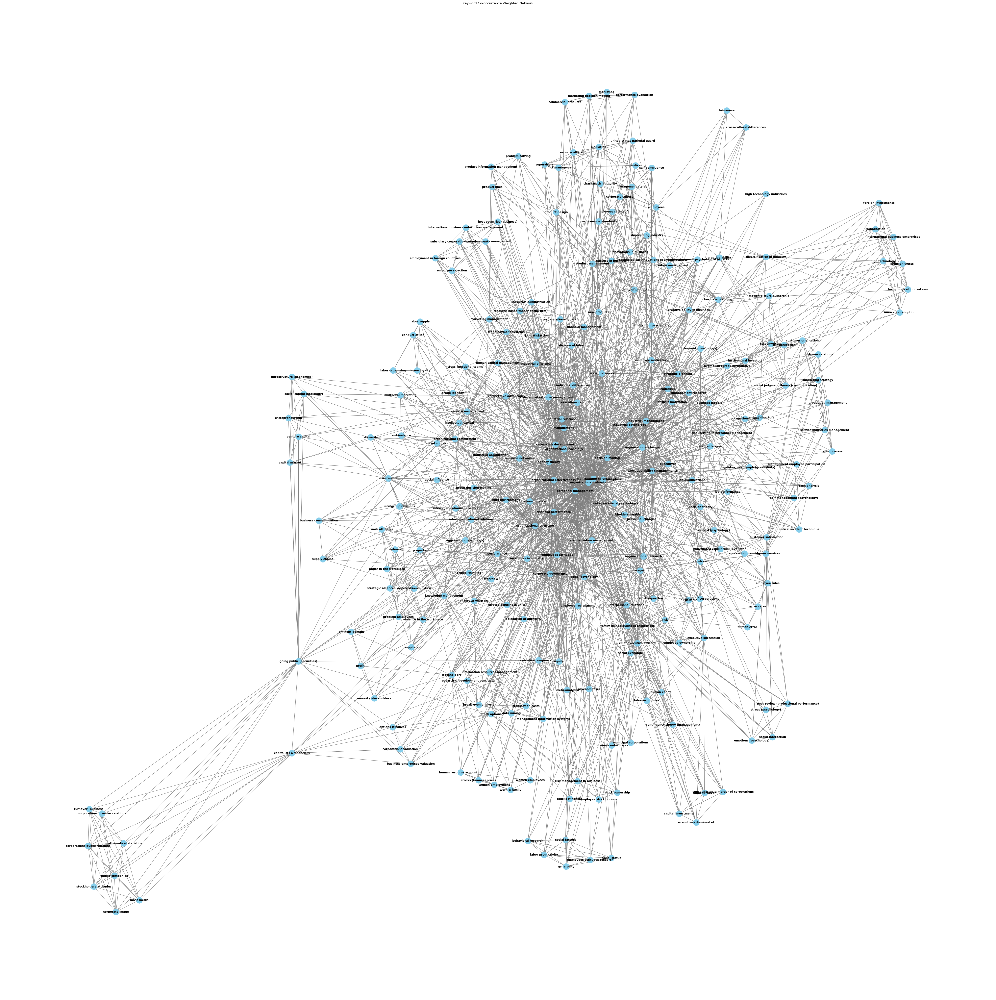

In [103]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load the co-occurrence matrix from the provided CSV file
file_path = "/Users/rosalinatorres/downloads/co_occurrence_matrix.csv"
co_occurrence_matrix = pd.read_csv(file_path, index_col=0)

# --- Data Cleaning ---
def clean_keyword(keyword: str) -> str:
    """Cleans a keyword string by removing double hyphens and standardizing whitespace."""
    cleaned_keyword = " ".join(keyword.split("--"))  # Replace "--" with space
    cleaned_keyword = " ".join(cleaned_keyword.split())  # Remove extra spaces
    return cleaned_keyword.strip()  # Remove leading/trailing spaces

# Apply the cleaning function to row and column names
co_occurrence_matrix.columns = co_occurrence_matrix.columns.map(clean_keyword)
co_occurrence_matrix.index = co_occurrence_matrix.index.map(clean_keyword)
# --- End Data Cleaning ---

# Ensure that column and index names are lowercase for consistency (case-insensitive)
co_occurrence_matrix.columns = co_occurrence_matrix.columns.str.lower()
co_occurrence_matrix.index = co_occurrence_matrix.index.str.lower()

# Initialize an empty undirected graph to store the weighted network
G_weighted = nx.Graph()

# Iterate over the co-occurrence matrix and add edges to the graph
for word1 in co_occurrence_matrix.index:
    for word2 in co_occurrence_matrix.columns:
        weight = co_occurrence_matrix.at[word1, word2]

        # Skip the pair if the weight is zero or NaN
        if pd.notna(weight) and weight > 0:
            G_weighted.add_edge(word1, word2, weight=weight)

# Display basic information about the graph
print(f"Number of Nodes: {G_weighted.number_of_nodes()}")
print(f"Number of Edges: {G_weighted.number_of_edges()}")

# Print a few sample edges with weights
print("\nSample edges with weights:")
for edge in list(G_weighted.edges(data=True))[:5]:
    print(edge)

# --- Visualize the Weighted Network ---
# Use spring layout for better visualization
pos = nx.spring_layout(G_weighted, k=0.1, iterations=20)

# Draw the network
plt.figure(figsize=(50, 50))
nx.draw(G_weighted, pos, with_labels=True, node_size=500, node_color="skyblue", font_size=10,
        font_weight="bold", width=1.0, edge_color="gray")

# Show the plot
plt.title("Keyword Co-occurrence Weighted Network")
plt.show()

### Making Data Speak: What Are Weighted Networks?

In business, relationships matter—not just who connects with whom, but how strongly they’re connected. A **weighted network** is a powerful way to visualize and quantify those connections, whether between customers, keywords, or markets. Each connection carries a **weight** that represents the strength or frequency of that relationship.

### Key Components of a Weighted Network
1. **Nodes**  
   These are the entities within the network. They could represent anything—keywords, people, cities, web pages, etc.

2. **Edges**  
   These are the connections between nodes, signifying that a relationship exists between them.

3. **Weights**  
   Weights are the numerical values assigned to the edges. They quantify the strength or magnitude of the relationship between the connected nodes.

### Examples of Weighted Networks
1. **Social Networks**  
   - **Nodes:** People  
   - **Edges:** Friendships  
   - **Weights:** Strength of friendship (e.g., number of interactions, messages exchanged)

2. **Transportation Networks**  
   - **Nodes:** Cities  
   - **Edges:** Roads or flight routes between cities  
   - **Weights:** Distance, travel time, or cost

3. **Keyword Co-occurrence Networks**  
   - **Nodes:** Keywords  
   - **Edges:** Keywords appearing in the same article  
   - **Weights:** The frequency of co-occurrence

### Why Use Weighted Networks?

#### More Information  
Weighted networks offer more detailed insights compared to unweighted networks, where edges simply indicate the presence or absence of a connection.

#### Realistic Modeling  
Many real-world networks feature varying connection strengths. Weights allow us to represent these differences accurately, making the network model more realistic.

#### Advanced Analysis  
Weights enable advanced analyses, such as:  
- Finding the shortest path between nodes  
- Identifying clusters of strongly connected nodes

### Summary
A weighted network is an invaluable tool for representing and analyzing relationships where the strength or significance of connections varies. In the case of a weighted keyword co-occurrence network, it helps identify and quantify the relationships between frequently associated keywords, providing deeper insights into the underlying patterns and structures.

### Compute Node Degree and Streghth 

In [104]:
import pandas as pd
import networkx as nx
import os
import re
import string


def clean_keyword(keyword: str) -> str:
    """
    Cleans and standardizes a single keyword.
    This function removes double hyphens, punctuation, and extra whitespace,
    and converts the keyword to lowercase.

    Args:
        keyword (str): The keyword string to clean.

    Returns:
        str: The cleaned keyword string.
    """
    keyword = re.sub(r'--+', ' ', keyword)  # Replace double hyphens with spaces
    keyword = re.sub(r'[' + string.punctuation + ']', '', keyword)  # Remove punctuation
    keyword = " ".join(keyword.split())  # Remove extra whitespace
    return keyword.lower().strip()  # Convert to lowercase and remove leading/trailing spaces


def analyze_cooccurrence_network(file_path: str) -> pd.DataFrame:
    """
    Analyzes a co-occurrence network from a CSV file, computing node degree and strength.

    Args:
        file_path (str): The path to the CSV file containing the co-occurrence matrix.

    Returns:
        pd.DataFrame: A DataFrame containing node degree and strength, sorted by strength.

    Raises:
        FileNotFoundError: If the specified file does not exist.
    """

    # Check if the file exists before loading
    if not os.path.isfile(file_path):
        raise FileNotFoundError(f"Error: The file '{file_path}' was not found.")

    # Load the co-occurrence matrix from the CSV file
    cooccurrence_matrix = pd.read_csv(file_path, index_col=0)

    # Clean the row and column names (keywords)
    cooccurrence_matrix.index = cooccurrence_matrix.index.map(clean_keyword)
    cooccurrence_matrix.columns = cooccurrence_matrix.columns.map(clean_keyword)

    # Initialize an undirected weighted graph
    weighted_graph = nx.Graph()

    # Add edges to the graph based on co-occurrence values
    for word1 in cooccurrence_matrix.index:
        for word2 in cooccurrence_matrix.columns:
            weight = cooccurrence_matrix.at[word1, word2]

            # Add an edge only if the weight is valid and greater than zero
            if pd.notna(weight) and weight > 0:
                weighted_graph.add_edge(word1, word2, weight=weight)

    # Compute Node Degree: The number of unique keywords a given keyword co-occurs with.
    # Formula: Degree(node) = Number of edges connected to the node
    node_degree = dict(weighted_graph.degree())

    # Compute Node Strength: The sum of edge weights connected to a node.
    # Formula: Strength(node) = Sum of edge weights connected to the node
    node_strength = {
        node: sum(data['weight'] for _, _, data in weighted_graph.edges(node, data=True))
        for node in weighted_graph.nodes()
    }

    # Store the results in a Pandas DataFrame
    node_analysis_df = pd.DataFrame({
        "Degree": node_degree,
        "Strength": node_strength
    })

    return node_analysis_df


if __name__ == "__main__":
    file_path = "/Users/rosalinatorres/downloads/co_occurrence_matrix.csv"
    node_analysis = analyze_cooccurrence_network(file_path)

    # Print the computed node degree and strength (Before Sorting)
    print("🔹 Node Degree and Strength (Before Sorting):")
    print(node_analysis.head(10))

    # Sorting by Strength (Descending)
    node_analysis_sorted = node_analysis.sort_values(by="Strength", ascending=False)

    # Print the computed node degree and strength (After Sorting by Strength):
    print("\n🔹 Node Degree and Strength (After Sorting by Strength):")
    print(node_analysis_sorted.head(10))

🔹 Node Degree and Strength (Before Sorting):
                                 Degree  Strength
stockholders attitudes                9       9.0
corporations public relations         9       9.0
corporate image                       9       9.0
mass media                            9       9.0
public companies                      9       9.0
corporations investor relations       9       9.0
going public securities              26      27.0
mathematical statistics               9       9.0
capitalists financiers               17      18.0
turnover business                     9       9.0

🔹 Node Degree and Strength (After Sorting by Strength):
                              Degree  Strength
organizational behavior          166     265.0
organizational effectiveness     104     144.0
management science               102     136.0
personnel management              93     126.0
decision making                   90     112.0
organizational structure          74     107.0
organizational soci

### Node Degree

**Definition:**  
The node degree of a keyword in a co-occurrence network reflects how many unique other keywords it directly connects to.

**Formula:**  
`Degree(node) = Number of edges connected to the node`

In code, this is computed with:  
`nx.degree(weighted_graph)`

**What it represents:**  
Simply put, node degree shows how many different keywords a given keyword co-occurs with.  
A high node degree means that keyword appears alongside many others—it’s well-connected.

**Why it matters:**  
Keywords with high degrees often act as **connectors**—touching many topics.  
These tend to be **broad, general, or central themes** within your data.  
Their reach suggests influence.

---

### Node Strength

**Definition:**  
Node strength captures the total weight of all connections a keyword has—in other words, how frequently it co-occurs with others.

**Formula:**  
`Strength(node) = Σ (weights of edges connected to the node)`

In code, this means summing the `'weight'` attribute for all edges linked to the node.

**What it represents:**  
Node strength reveals the *intensity* of those connections.  
Even if a keyword connects with just a few others, doing so repeatedly gives it strong ties.

**Why it matters:**  
High-strength keywords aren’t just connected—they’re **deeply entwined** with other keywords.  
They signify **tight thematic clusters** or **core ideas** that show up together often.

---

### Degree vs. Strength

Think of **degree** as *how many friends* a keyword has, and **strength** as *how close those friendships are*.

- A keyword with **high degree but low strength** has many connections, but each is weak—it shows up with many, but not often.
- A keyword with **low degree but high strength** has fewer partners, but the co-occurrence is strong and frequent—think deep, loyal associations.

| **Metric** | **Analogy**               | **Insight Gained**                       |
|------------|---------------------------|------------------------------------------|
| Degree     | “How many friends?”       | Indicates versatility and reach          |
| Strength   | “How close are they?”     | Highlights intensity and frequency of associations |

### Top 10 Nodes by Degree and Strength

In [35]:
import pandas as pd
import networkx as nx
import os

# Define file path
file_path = "/Users/rosalinatorres/downloads/co_occurrence_matrix.csv"

# Check if file exists before loading
if not os.path.isfile(file_path):
    raise FileNotFoundError(f"Error: The file '{file_path}' was not found.")

# Load the co-occurrence matrix
co_occurrence_matrix = pd.read_csv(file_path, index_col=0)

# Initialize an undirected weighted graph
G_weighted = nx.Graph()

# Add edges based on co-occurrence values
for word1 in co_occurrence_matrix.index:
    for word2 in co_occurrence_matrix.columns:
        weight = co_occurrence_matrix.at[word1, word2]
        
        # Add edge only if weight is valid and > 0
        if pd.notna(weight) and weight > 0:
            G_weighted.add_edge(word1, word2, weight=weight)

# Compute node degree (number of connections per node)
node_degree = dict(G_weighted.degree())

# Compute node strength (sum of edge weights per node)
node_strength = {node: sum(data['weight'] for _, _, data in G_weighted.edges(node, data=True))
                 for node in G_weighted.nodes()}

# Create DataFrames for degree and strength
node_analysis_df = pd.DataFrame({
    "Degree": node_degree,
    "Strength": node_strength
})

# Sort by Degree (most connected keywords)
node_analysis_df_sorted_by_degree = node_analysis_df.sort_values(by="Degree", ascending=False)

# Sort by Strength (highest co-occurrence intensity)
node_analysis_df_sorted_by_strength = node_analysis_df.sort_values(by="Strength", ascending=False)

# Display results
print("🔹 Top 10 Nodes by Degree (Most Connected Keywords):")
print(node_analysis_df_sorted_by_degree.head(10))

print("\n🔹 Top 10 Nodes by Strength (Most Influential Keywords):")
print(node_analysis_df_sorted_by_strength.head(10))

🔹 Top 10 Nodes by Degree (Most Connected Keywords):
                              Degree  Strength
organizational behavior          166     265.0
organizational effectiveness     104     144.0
management science               102     136.0
personnel management              93     126.0
decision making                   90     112.0
organizational structure          74     107.0
organizational sociology          66      96.0
strategic planning                66      80.0
industrial management             64      84.0
corporate governance              62      85.0

🔹 Top 10 Nodes by Strength (Most Influential Keywords):
                              Degree  Strength
organizational behavior          166     265.0
organizational effectiveness     104     144.0
management science               102     136.0
personnel management              93     126.0
decision making                   90     112.0
organizational structure          74     107.0
organizational sociology          66      96.

### Task 6:  Show the top 10 node pairs by weight

In [96]:
import pandas as pd
import networkx as nx
import os

def analyze_keyword_cooccurrence(file_path: str) -> None:
    """
    Analyzes keyword co-occurrence from a CSV file, identifies and prints the
    top 10 strongest keyword pairs.

    Args:
        file_path (str): The path to the CSV file containing the co-occurrence matrix.

    Raises:
        FileNotFoundError: If the specified file does not exist.
    """

    # 1. Load the Co-occurrence Matrix
    # Check if the file exists before attempting to load it.
    if not os.path.isfile(file_path):
        raise FileNotFoundError(f"Error: The file '{file_path}' was not found.")

    # Load the co-occurrence matrix from the CSV file into a Pandas DataFrame.
    cooccurrence_matrix_df = pd.read_csv(file_path, index_col=0)

    # 2. Preprocess the Data
    # Fill any missing values (NaN) in the co-occurrence matrix with 0.
    # This ensures that there are no issues with calculations later.
    cooccurrence_matrix_df = cooccurrence_matrix_df.fillna(0)

    # Convert row and column names to lowercase for case-insensitive comparisons.
    cooccurrence_matrix_df.columns = cooccurrence_matrix_df.columns.str.lower()
    cooccurrence_matrix_df.index = cooccurrence_matrix_df.index.str.lower()

    # 3. Create the Network Graph
    # Initialize an empty undirected weighted graph using NetworkX.
    weighted_graph = nx.Graph()

    # Iterate over the co-occurrence matrix to add edges to the graph.
    for word1 in cooccurrence_matrix_df.index:
        for word2 in cooccurrence_matrix_df.columns:
            weight = cooccurrence_matrix_df.at[word1, word2]

            # Add an edge between word1 and word2 if their co-occurrence weight is greater than 0.
            if weight > 0:
                weighted_graph.add_edge(word1, word2, weight=weight)

    # 4. Identify Top 10 Unique Keyword Pairs by Co-occurrence Weight
    # Retrieve all edges with their weights and sort them in descending order.
    sorted_edges = sorted(weighted_graph.edges(data=True),
                          key=lambda x: x[2]['weight'],
                          reverse=True)

    # Ensure each pair is only listed once (i.e., "equity, sociology" and
    # "sociology, equity" should be treated the same).
    unique_sorted_edges = sorted(set([tuple(sorted([edge[0], edge[1]]))
                                     for edge in sorted_edges]),
                                  key=lambda x: weighted_graph[x[0]][x[1]]['weight'],
                                  reverse=True)

    # 5. Display the Top 10 Strongest Keyword Pairs (Edges)
    print("🔹 Top 10 Strongest Keyword Pairs (Edges) by Co-occurrence Weight:")
    print("=" * 50)
    for i, (node1, node2) in enumerate(unique_sorted_edges[:10], start=1):
        weight = weighted_graph[node1][node2]['weight']
        print(f"{i}. {node1} ↔ {node2} | Weight: {weight}")


if __name__ == "__main__":
    # Define the path to the CSV file containing the co-occurrence matrix.
    file_path = "/Users/rosalinatorres/downloads/co_occurrence_matrix.csv"
    analyze_keyword_cooccurrence(file_path)

🔹 Top 10 Strongest Keyword Pairs (Edges) by Co-occurrence Weight:
1. organizational behavior ↔ organizational effectiveness | Weight: 11.0
2. organizational behavior ↔ organizational structure | Weight: 9.0
3. organizational behavior ↔ personnel management | Weight: 8.0
4. management science ↔ organizational behavior | Weight: 7.0
5. decision making ↔ organizational behavior | Weight: 6.0
6. corporate governance ↔ organizational behavior | Weight: 6.0
7. organizational effectiveness ↔ organizational structure | Weight: 6.0
8. organizational behavior ↔ organizational sociology | Weight: 6.0
9. industrial relations ↔ organizational behavior | Weight: 5.0
10. management ↔ organizational behavior | Weight: 5.0


### Results Summary

The output shows the top 10 strongest keyword pairs based on their co-occurrence weight. 

* **Format:** Each line shows two keywords connected by a double-headed arrow ("↔") and their co-occurrence weight.
* **Weight:** The "Weight" value indicates how frequently those two keywords appeared together in the dataset. A higher weight means the keywords co-occurred more often.
* **Strongest Relationships:** The list shows the strongest relationships between keywords in the dataset. For example, "organizational behavior" and "organizational effectiveness" have the highest co-occurrence weight (11.0), suggesting a very strong relationship.
* **Key Themes:** By looking at the keywords, we can start to identify key themes or topics in your dataset. In this case, "organizational behavior" appears frequently, indicating it's a central theme.

---

### Overall Interpretation

The code and results together reveal the most prominent keyword associations within the data. This can be valuable for:

* **Topic Modeling:** Understanding the main topics and subtopics present.
* **Information Retrieval:** Improving search queries by considering related keywords.
* **Text Summarization:** Identifying key concepts to include in summaries.
* **Domain Analysis:** Gaining insights into the structure and terminology of a specific field.

In the specific example, the results suggest that "organizational behavior" is a highly connected and frequently co-occurring concept, strongly linked to "organizational effectiveness," "organizational structure," and "personnel management."

⸻

### 🔍 Code Summary: Topological & Semantic Insights from Keyword Co-occurrence

### 🎼 Data Loading & Preprocessing
- Reads a co-occurrence matrix CSV into a Pandas DataFrame.
- Fills `NaN` values with 0 to account for sparse data.
- Standardizes keywords to lowercase for uniform comparison.

### 🧠 Graph Construction with NetworkX
- Constructs a **weighted undirected graph** where:
  - **Nodes** represent keywords.
  - **Edges** denote co-occurrence relationships.
  - **Edge weights** reflect co-occurrence frequency (semantic closeness).

### 📊 Topological Metrics Computed

| Metric   | Purpose                    | Analogy               | Insight Gained                                  |
|----------|----------------------------|------------------------|-------------------------------------------------|
| Degree   | Number of direct links     | “How many friends?”    | Highlights keyword **versatility** & **reach**  |
| Strength | Sum of edge weights        | “How close are they?”  | Reveals **depth** of associations               |

- **Node Degree**: Identifies keywords with the **broadest** connections.
- **Node Strength**: Measures the **intensity** of those relationships.

### 🧩 Edge Analysis: Top 10 Keyword Pairs by Weight
- Surfaces the **strongest** keyword pairs by frequency of co-occurrence.
- Ensures **uniqueness** in reporting: treats `A-B` and `B-A` as one.

⸻

### 🌟 Findings Recap

### 👑 Top Node by Both Degree & Strength
- `**organizational behavior**` reigns supreme — the most **connected** and most **influential** node in the network.

### 🔗 Top Co-occurring Pair
- `organizational behavior` ⟷ `organizational effectiveness`  
  **Weight:** `11.0`  
  — A **robust axis** in the language of organizational studies.

⸻

### Visualizing Degree vs. Strength in a Keyword Co-occurrence Network

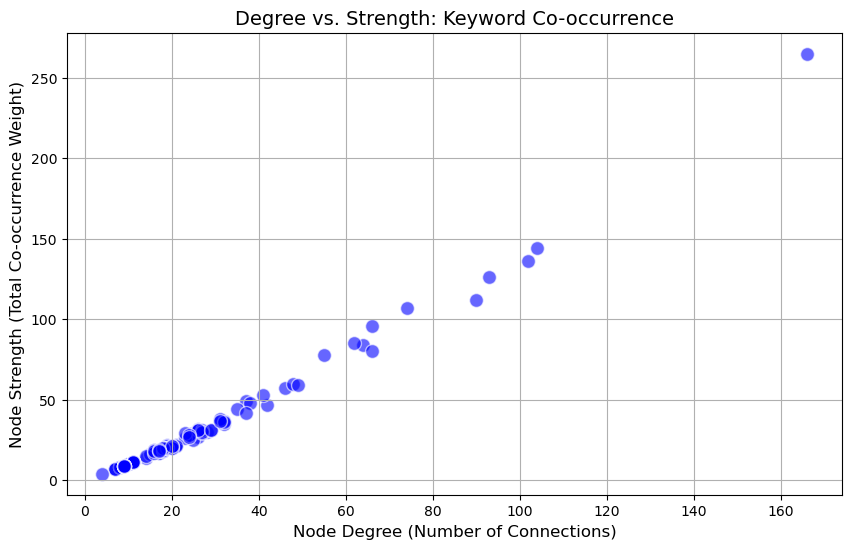

In [97]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import os

def analyze_and_visualize_cooccurrence(file_path: str) -> None:
    """
    Analyzes keyword co-occurrence from a CSV file, constructs a weighted graph,
    calculates node degree and strength, and visualizes the relationship
    between them using a scatter plot.

    Args:
        file_path (str): The path to the CSV file containing the co-occurrence matrix.

    Raises:
        FileNotFoundError: If the specified file does not exist.
    """

    # 1. Load the Co-occurrence Matrix
    # Check if the file exists before attempting to load it.
    if not os.path.isfile(file_path):
        raise FileNotFoundError(f"Error: The file '{file_path}' was not found.")

    # Load the co-occurrence matrix from the CSV file into a Pandas DataFrame.
    cooccurrence_matrix_df = pd.read_csv(file_path, index_col=0)

    # 2. Preprocess the Data
    # Fill any missing values (NaN) in the co-occurrence matrix with 0.
    # This ensures that there are no issues with calculations later.
    cooccurrence_matrix_df = cooccurrence_matrix_df.fillna(0)

    # Convert row and column names to lowercase for case-insensitive comparisons.
    cooccurrence_matrix_df.columns = cooccurrence_matrix_df.columns.str.lower()
    cooccurrence_matrix_df.index = cooccurrence_matrix_df.index.str.lower()

    # 3. Create the Weighted Undirected Graph
    # Initialize an empty undirected weighted graph using NetworkX.
    weighted_graph = nx.Graph()

    # Iterate over the co-occurrence matrix to add edges to the graph.
    for word1 in cooccurrence_matrix_df.index:
        for word2 in cooccurrence_matrix_df.columns:
            weight = cooccurrence_matrix_df.at[word1, word2]

            # Add an edge between word1 and word2 if their co-occurrence weight is greater than 0.
            if weight > 0:
                weighted_graph.add_edge(word1, word2, weight=weight)

    # 4. Compute Node Degree
    # Node Degree: The number of unique keywords a given keyword co-occurs with.
    # Formula: Degree(node) = Number of edges connected to the node
    node_degree = dict(weighted_graph.degree())

    # 5. Compute Node Strength
    # Node Strength: The sum of edge weights connected to a node, representing the total co-occurrence strength.
    # Formula: Strength(node) = Σ (weights of edges connected to the node)
    node_strength = {
        node: sum(data['weight'] for _, _, data in weighted_graph.edges(node, data=True))
        for node in weighted_graph.nodes()
    }

    # 6. Prepare Data for Plotting
    # Convert results into lists for plotting.
    degrees = list(node_degree.values())
    strengths = list(node_strength.values())

    # 7. Create and Display the Scatter Plot
    # Create a scatter plot to visualize the relationship between Node Degree and Node Strength.
    plt.figure(figsize=(10, 6))
    plt.scatter(degrees, strengths, alpha=0.6, color='b', edgecolors='w', s=100)
    plt.title('Degree vs. Strength: Keyword Co-occurrence', fontsize=14)
    plt.xlabel('Node Degree (Number of Connections)', fontsize=12)
    plt.ylabel('Node Strength (Total Co-occurrence Weight)', fontsize=12)
    plt.grid(True)
    plt.show()


if __name__ == "__main__":
    # Define the path to the CSV file containing the co-occurrence matrix.
    file_path = "/Users/rosalinatorres/downloads/co_occurrence_matrix.csv"
    analyze_and_visualize_cooccurrence(file_path)

## Understanding the Graph: Degree vs. Strength

This graph is a scatter plot that visually represents the relationship between two important network metrics for our keywords:

* **X-axis: Node Degree (Number of Connections)**
    * This shows how many *different* keywords a given keyword co-occurs with.
    * Keywords on the right side of the graph have a high degree, meaning they are connected to many other keywords.

* **Y-axis: Node Strength (Total Co-occurrence Weight)**
    * This shows the *total frequency* with which a given keyword co-occurs with other keywords.
    * Keywords higher up on the graph have high strength, meaning their connections are, on average, stronger (higher co-occurrence counts).

**What the Graph Tells You**

This graph helps you understand the role and importance of keywords in your co-occurrence network. Here are some key interpretations:

* **Central and Influential Keywords:**
    * Keywords in the upper-right corner are both highly connected (high degree) and strongly related (high strength).
    * These are the most important keywords in your network. They co-occur frequently with many other keywords, suggesting they are central to the topics being discussed.

* **Broad vs. Specific Keywords:**
    * Keywords with high degree but moderate strength might represent broader topics that appear in many contexts but not always with high frequency.
    * Keywords with high strength but moderate degree might represent more specific topics that co-occur frequently with a smaller set of related keywords.

* **Peripheral Keywords:**
    * Keywords in the lower-left corner have low degree and low strength.
    * These keywords have fewer connections and less frequent co-occurrence, indicating they are less central and potentially more peripheral to the main topics.

* **Relationship Between Degree and Strength:**
    * The overall pattern of the graph reveals the general relationship between degree and strength in your network.
    * Ideally, you'd expect a positive correlation: keywords with more connections tend to have higher overall co-occurrence. However, deviations from this trend are also interesting.

**Why This Is Useful**

* **Identifying Key Themes:** You can identify the most important keywords and the main themes of your dataset.
* **Understanding Keyword Roles:** You can understand whether keywords are broad, specific, or peripheral.
* **Guiding Further Analysis:** This graph can guide further network analysis, such as identifying clusters of related keywords or exploring the flow of information in the network.

---

## 💡 Key Business Insights

1. **Strategic Language Mapping**  
   Keyword co-occurrence patterns expose how academic and technical domains frame their narratives—valuable for aligning product messaging, academic positioning, or policy proposals.

2. **Opportunity Discovery in Emerging Themes**  
   Network clusters highlight topic convergence and whitespace, informing investment areas for R&D, content strategy, or thought leadership.

3. **Semantic Precision for Decision Systems**  
   By removing noise and amplifying domain-specific terms, this project sharpens the signal for building smarter search, tagging, and classification engines.

4. **Scalable Approach**  
   The pipeline—built with Python and open-source NLP tools—is reusable for real-world corpora including customer feedback, product documentation, or knowledge bases.

5. **Cross-Functional Relevance**  
   This methodology empowers data science, marketing, and strategic planning teams to speak a shared language—rooted in evidence, not assumption.

---

📎 **Note to Reviewers:**  
This project bridges theory and application, demonstrating not just technical fluency in text analytics, but a clear line of sight to business impact. Ideal for roles requiring data-driven storytelling, strategic insights, or AI-powered content intelligence.